In [1]:
# Import necessary packages
import pandas as pd
import numpy as np
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

In [2]:
# Set pandas's max row display 
pd.set_option('display.max_row', 1000)

In [3]:
# Set pandas's max column width to 50 
pd.set_option('display.max_columns', 50)

In [4]:
# Load in the Chicago crime dataset
df = pd.read_csv(r"E:\UG PROJECT\FIR\NYPD_Complaint_Data_Current__Year_To_Date_.csv")


In [5]:
## Print first 5 lines of dataset 
df.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,OFNS_DESC,PARKS_NM,PATROL_BORO,PD_CD,PD_DESC,PREM_TYP_DESC,RPT_DT,STATION_NAME,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,TRANSIT_DISTRICT,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,302027420,9,MANHATTAN,03/04/2025,01:44:00,03/04/2025,02:03:00,COMPLETED,(null),NaN,0,N.Y. POLICE DEPT,107,FELONY,INSIDE,BURGLARY,(null),PATROL BORO MAN SOUTH,213.0,"BURGLARY,COMMERCIAL,NIGHT",RESTAURANT/DINER,03/04/2025,(null),UNKNOWN,UNKNOWN,M,NaN,UNKNOWN,UNKNOWN,D,987520.0,202899.0,40.723596,-73.988202,"(40.723596, -73.988202)",POINT (-73.988202 40.723596)
1,300101172,73,BROOKLYN,01/26/2025,14:23:00,01/26/2025,14:50:00,COMPLETED,(null),NaN,97,OTHER,114,FELONY,INSIDE,ARSON,(null),PATROL BORO BKLYN NORTH,263.0,"ARSON 2,3,4",HOMELESS SHELTER,01/27/2025,(null),18-24,BLACK,M,NaN,45-64,BLACK,M,1010654.0,185578.0,40.676015,-73.904808,"(40.676015, -73.904808)",POINT (-73.904808 40.676015)
2,303359464,52,BRONX,03/21/2025,13:20:00,03/21/2025,13:30:00,COMPLETED,(null),NaN,0,N.Y. POLICE DEPT,233,MISDEMEANOR,FRONT OF,SEX CRIMES,(null),PATROL BORO BRONX,175.0,"SEXUAL ABUSE 3,2",BUS (NYC TRANSIT),03/21/2025,(null),45-64,BLACK,M,NaN,25-44,BLACK,F,1017478.0,256069.0,40.869470,-73.879861,"(40.8694704770483, -73.8798608037303)",POINT (-73.8798608037303 40.8694704770483)
3,303658318,52,BRONX,03/26/2025,07:00:00,NaN,(null),COMPLETED,(null),NaN,0,N.Y. POLICE DEPT,578,VIOLATION,INSIDE,HARRASSMENT 2,(null),PATROL BORO BRONX,637.0,"HARASSMENT,SUBD 1,CIVILIAN",HOMELESS SHELTER,03/26/2025,(null),25-44,BLACK,F,NaN,45-64,WHITE HISPANIC,F,0.0,0.0,0.000000,0.000000,"(0.0, 0.0)",POINT (0 0)
4,302761839,45,BRONX,03/13/2025,17:53:00,03/13/2025,17:53:00,COMPLETED,(null),NaN,0,N.Y. POLICE DEPT,105,FELONY,FRONT OF,ROBBERY,(null),PATROL BORO BRONX,387.0,"ROBBERY,CLOTHING",OTHER,03/13/2025,(null),<18,BLACK,M,NaN,<18,BLACK HISPANIC,M,1032973.0,255964.0,40.869113,-73.823836,"(40.869113, -73.823836)",POINT (-73.823836 40.869113)


In [6]:
## Print last 5 lines of dataset 
df.tail() 
df.columns

Index(['CMPLNT_NUM', 'ADDR_PCT_CD', 'BORO_NM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM',
       'CMPLNT_TO_DT', 'CMPLNT_TO_TM', 'CRM_ATPT_CPTD_CD', 'HADEVELOPT',
       'HOUSING_PSA', 'JURISDICTION_CODE', 'JURIS_DESC', 'KY_CD', 'LAW_CAT_CD',
       'LOC_OF_OCCUR_DESC', 'OFNS_DESC', 'PARKS_NM', 'PATROL_BORO', 'PD_CD',
       'PD_DESC', 'PREM_TYP_DESC', 'RPT_DT', 'STATION_NAME', 'SUSP_AGE_GROUP',
       'SUSP_RACE', 'SUSP_SEX', 'TRANSIT_DISTRICT', 'VIC_AGE_GROUP',
       'VIC_RACE', 'VIC_SEX', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude',
       'Longitude', 'Lat_Lon', 'New Georeferenced Column'],
      dtype='object')

In [7]:
## Check if any rows are missing data and are null 
df['OFNS_DESC'].isnull().values.any()

False

In [8]:
## Count number of observations for each crime 
df['OFNS_DESC'].value_counts() 

OFNS_DESC
PETIT LARCENY                       25709
HARRASSMENT 2                       20064
ASSAULT 3 & RELATED OFFENSES        13730
GRAND LARCENY                       10284
CRIMINAL MISCHIEF & RELATED OF       8731
VEHICLE AND TRAFFIC LAWS             6875
FELONY ASSAULT                       6408
DANGEROUS DRUGS                      5058
MISCELLANEOUS PENAL LAW              4860
OTHER OFFENSES RELATED TO THEFT      4805
OFF. AGNST PUB ORD SENSBLTY &        4532
ROBBERY                              3108
BURGLARY                             3086
GRAND LARCENY OF MOTOR VEHICLE       2778
SEX CRIMES                           2331
DANGEROUS WEAPONS                    2271
OFFENSES AGAINST PUBLIC ADMINI       2235
FORGERY                              1751
OTHER STATE LAWS                     1266
ADMINISTRATIVE CODE                  1153
CRIMINAL TRESPASS                    1050
INTOXICATED & IMPAIRED DRIVING        939
OFFENSES INVOLVING FRAUD              755
THEFT-FRAUD             

In [9]:
# Crime type frequency
crime_type_df = df['OFNS_DESC'].value_counts(ascending=True)

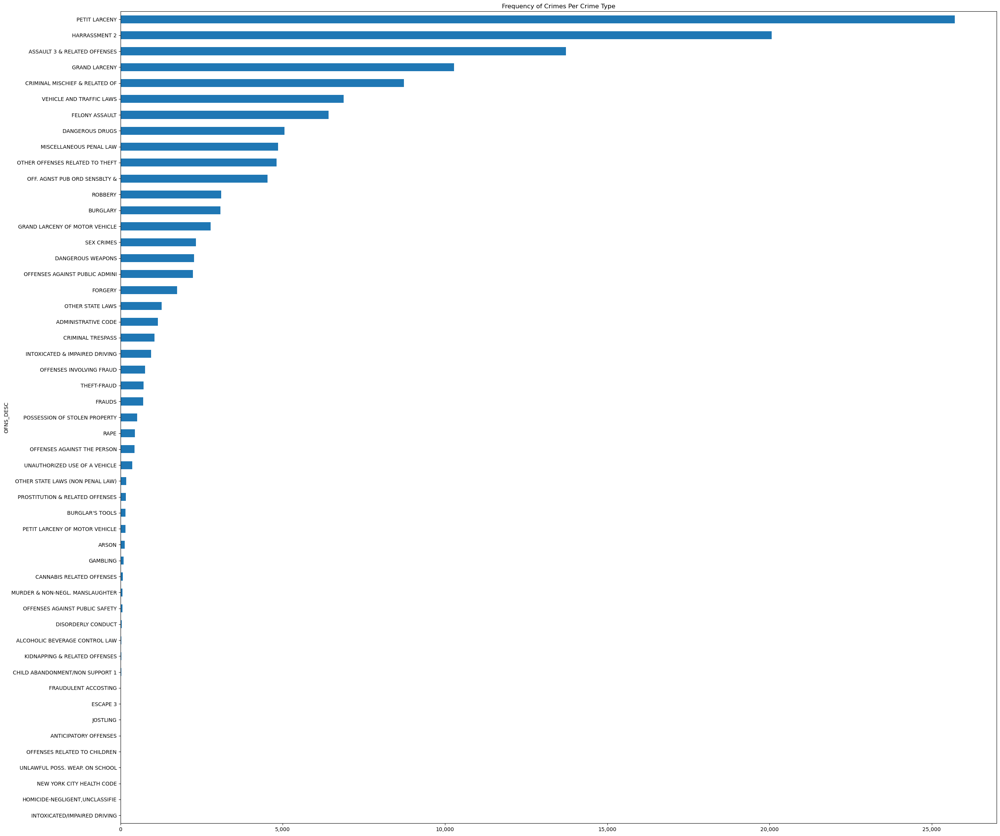

In [55]:
# Plot Crime Type Frequency
fig = plt.figure(figsize=(30, 28))
plt.title("Frequency of Crimes Per Crime Type")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Type of Crime")
ax = crime_type_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.savefig('crime_type_frequency.png')
plt.show()


In [11]:
## Check if any rows are missing data and are null 
df['CMPLNT_FR_DT'].isnull().values.any()

False

In [12]:
## Count number of reported crimes for each year 
df['CMPLNT_FR_DT'].value_counts()

CMPLNT_FR_DT
03/12/2025    1711
01/17/2025    1675
02/07/2025    1654
03/19/2025    1643
01/03/2025    1635
              ... 
10/10/2011       1
11/10/2023       1
04/05/2024       1
11/01/2005       1
01/14/2023       1
Name: count, Length: 1005, dtype: int64

In [13]:
## Plot these for better visualization 
crime_year_df = df['CMPLNT_FR_DT'].value_counts(ascending=True)

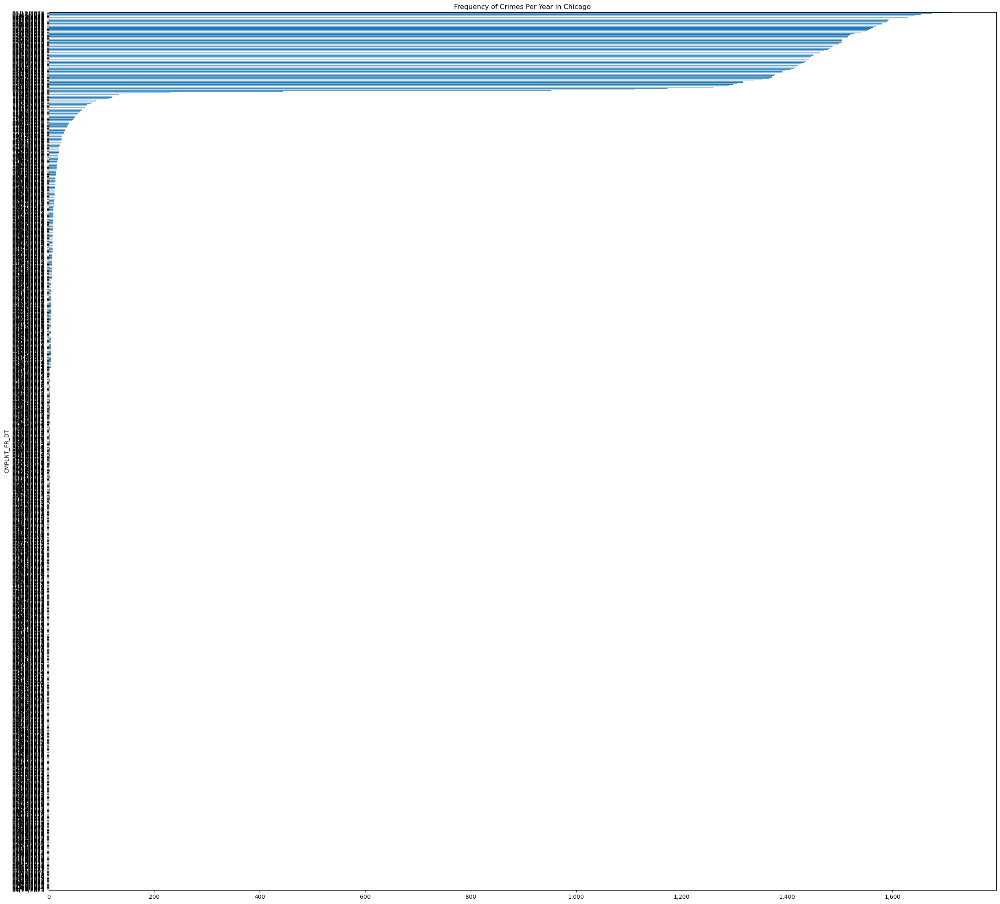

In [15]:
## Some formatting to make it look nicer 
fig = plt.figure(figsize=(30, 28))
plt.title("Frequency of Crimes Per Year in Chicago")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Year")

ax = crime_year_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

fig = ax.get_figure()
fig.savefig('bar_graph.png')

plt.show()  # <- Call the function properly


In [16]:
## Check if any rows are missing data and are null 
df['CRM_ATPT_CPTD_CD'].isnull().values.any()

False

In [17]:
## Count number of successful arrests for each year 

df['CRM_ATPT_CPTD_CD'].value_counts()

CRM_ATPT_CPTD_CD
COMPLETED    136613
ATTEMPTED      1633
Name: count, dtype: int64

In [18]:
# Assuming df is your DataFrame 
# Replace 'IC' and 'AO' with False, and 'AA' with True 
df['CRM_ATPT_CPTD_CD'] = df['CRM_ATPT_CPTD_CD'].map({'ATTEMPTED': False, 'COMPLETED': 
True})

In [19]:
# Now you'll have boolean values in the 'Status' column 
print(df) 
df.head()

       CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM  \
0       302027420            9  MANHATTAN   03/04/2025     01:44:00   
1       300101172           73   BROOKLYN   01/26/2025     14:23:00   
2       303359464           52      BRONX   03/21/2025     13:20:00   
3       303658318           52      BRONX   03/26/2025     07:00:00   
4       302761839           45      BRONX   03/13/2025     17:53:00   
...           ...          ...        ...          ...          ...   
138241  302238102          109     QUEENS   03/07/2025     16:44:00   
138242  301969900          109     QUEENS   03/03/2025     13:00:00   
138243  303058005          113     QUEENS   03/10/2025     07:45:00   
138244  300633956           47      BRONX   01/27/2025     08:00:00   
138245  304109652          106     QUEENS   03/30/2025     02:05:00   

       CMPLNT_TO_DT CMPLNT_TO_TM  CRM_ATPT_CPTD_CD HADEVELOPT  HOUSING_PSA  \
0        03/04/2025     02:03:00              True     (null)        

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,OFNS_DESC,PARKS_NM,PATROL_BORO,PD_CD,PD_DESC,PREM_TYP_DESC,RPT_DT,STATION_NAME,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,TRANSIT_DISTRICT,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,302027420,9,MANHATTAN,03/04/2025,01:44:00,03/04/2025,02:03:00,True,(null),NaN,0,N.Y. POLICE DEPT,107,FELONY,INSIDE,BURGLARY,(null),PATROL BORO MAN SOUTH,213.0,"BURGLARY,COMMERCIAL,NIGHT",RESTAURANT/DINER,03/04/2025,(null),UNKNOWN,UNKNOWN,M,NaN,UNKNOWN,UNKNOWN,D,987520.0,202899.0,40.723596,-73.988202,"(40.723596, -73.988202)",POINT (-73.988202 40.723596)
1,300101172,73,BROOKLYN,01/26/2025,14:23:00,01/26/2025,14:50:00,True,(null),NaN,97,OTHER,114,FELONY,INSIDE,ARSON,(null),PATROL BORO BKLYN NORTH,263.0,"ARSON 2,3,4",HOMELESS SHELTER,01/27/2025,(null),18-24,BLACK,M,NaN,45-64,BLACK,M,1010654.0,185578.0,40.676015,-73.904808,"(40.676015, -73.904808)",POINT (-73.904808 40.676015)
2,303359464,52,BRONX,03/21/2025,13:20:00,03/21/2025,13:30:00,True,(null),NaN,0,N.Y. POLICE DEPT,233,MISDEMEANOR,FRONT OF,SEX CRIMES,(null),PATROL BORO BRONX,175.0,"SEXUAL ABUSE 3,2",BUS (NYC TRANSIT),03/21/2025,(null),45-64,BLACK,M,NaN,25-44,BLACK,F,1017478.0,256069.0,40.869470,-73.879861,"(40.8694704770483, -73.8798608037303)",POINT (-73.8798608037303 40.8694704770483)
3,303658318,52,BRONX,03/26/2025,07:00:00,NaN,(null),True,(null),NaN,0,N.Y. POLICE DEPT,578,VIOLATION,INSIDE,HARRASSMENT 2,(null),PATROL BORO BRONX,637.0,"HARASSMENT,SUBD 1,CIVILIAN",HOMELESS SHELTER,03/26/2025,(null),25-44,BLACK,F,NaN,45-64,WHITE HISPANIC,F,0.0,0.0,0.000000,0.000000,"(0.0, 0.0)",POINT (0 0)
4,302761839,45,BRONX,03/13/2025,17:53:00,03/13/2025,17:53:00,True,(null),NaN,0,N.Y. POLICE DEPT,105,FELONY,FRONT OF,ROBBERY,(null),PATROL BORO BRONX,387.0,"ROBBERY,CLOTHING",OTHER,03/13/2025,(null),<18,BLACK,M,NaN,<18,BLACK HISPANIC,M,1032973.0,255964.0,40.869113,-73.823836,"(40.869113, -73.823836)",POINT (-73.823836 40.869113)


In [20]:
# Assuming df is your DataFrame 
# Let's say 'Status' column contains numeric strings 
df['CRM_ATPT_CPTD_CD'] = df['CRM_ATPT_CPTD_CD'].astype(int)

In [22]:
# Now perform your calculations 
arrest_df = df['CRM_ATPT_CPTD_CD'].value_counts() 
arrest_percent = (arrest_df / df['CRM_ATPT_CPTD_CD'].sum()) * 100 

In [23]:
# Rename Series.name 
arrest_percent.rename("% of count", inplace=True) 

CRM_ATPT_CPTD_CD
1    100.000000
0      1.195347
Name: % of count, dtype: float64

In [24]:
# Now you can continue with your code 
## Convert values into percentages 
arrest_df = df['CRM_ATPT_CPTD_CD'].value_counts() 
arrest_percent = (arrest_df / df['CRM_ATPT_CPTD_CD'].sum()) * 100 

In [25]:
## Rename Series.name 
arrest_percent.rename("% of Arrests",inplace=True)

CRM_ATPT_CPTD_CD
1    100.000000
0      1.195347
Name: % of Arrests, dtype: float64

In [26]:
## Rename True and False to % Arrested and % Not Arrested 
arrest_percent.rename({True: '% Arrested', False: '% Not Arrested'},inplace=True) 

In [27]:
## Format pie chart to nicely show percentage and count 
def make_autopct(values): 
    def my_autopct(pct): 
        total = sum(values) 
        val = int(round(pct*total/100.0)) 
        return '{p:.2f}%  ({v:d})'.format(p=pct,v=val) 
    return my_autopct

In [28]:
## Plot results in a pie chart 
arrest_percent.plot.pie(fontsize=11, 
autopct=make_autopct(df['CRM_ATPT_CPTD_CD'].value_counts()), 
figsize=(8, 8)) 
plt.savefig('pie_chart.png')

In [29]:
## Group dataset by year and arrests 
arrest_per_year = df.groupby('CMPLNT_FR_DT')['CRM_ATPT_CPTD_CD'].value_counts().rename('Counts').to_frame() 
arrest_per_year['Percentage'] = (100 * arrest_per_year / 
arrest_per_year.groupby(level=0).sum()) 
arrest_per_year.reset_index(level=[1],inplace=True) 
arrest_per_year

,CRM_ATPT_CPTD_CD,Counts,Percentage
CMPLNT_FR_DT,,,
01/01/1970,1,1,100.000000
01/01/1975,1,1,100.000000
01/01/1979,1,1,100.000000
01/01/1989,1,1,100.000000
01/01/1991,1,1,100.000000
...,...,...,...
12/31/2021,1,1,100.000000
12/31/2022,1,1,100.000000
12/31/2023,1,1,100.000000


In [30]:
# Group by 'year' and calculate the percentage of successful arrests 
arrest_percentages = df.groupby('CMPLNT_FR_DT')['CRM_ATPT_CPTD_CD'].mean() * 100

In [31]:
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed 
arrest_percentages.plot(kind='line', marker='o', color='b')

<Axes: xlabel='CMPLNT_FR_DT'>

In [32]:
# Set the labels and title 
plt.title('Percentage of Successful Arrests Over Time') 
plt.xlabel('Year') 
plt.ylabel('Percentage of Successful Arrests')

Text(83.09722222222221, 0.5, 'Percentage of Successful Arrests')

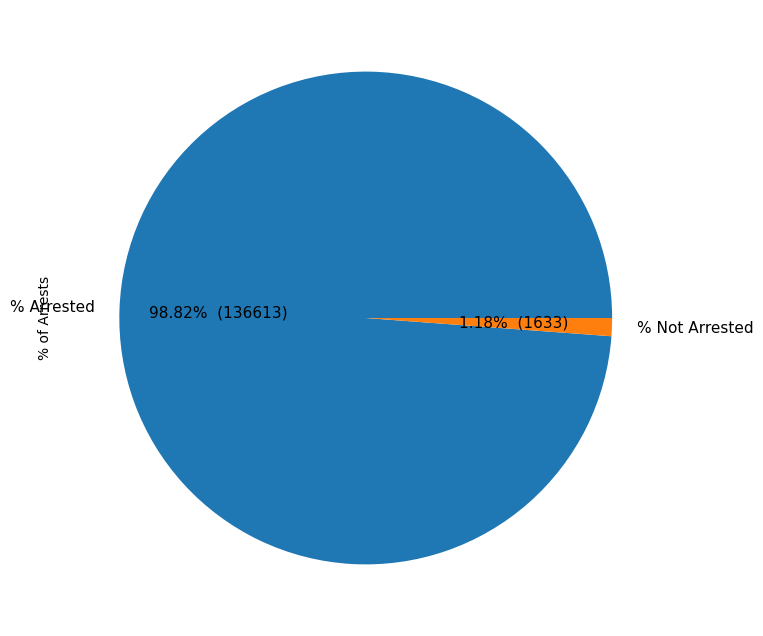

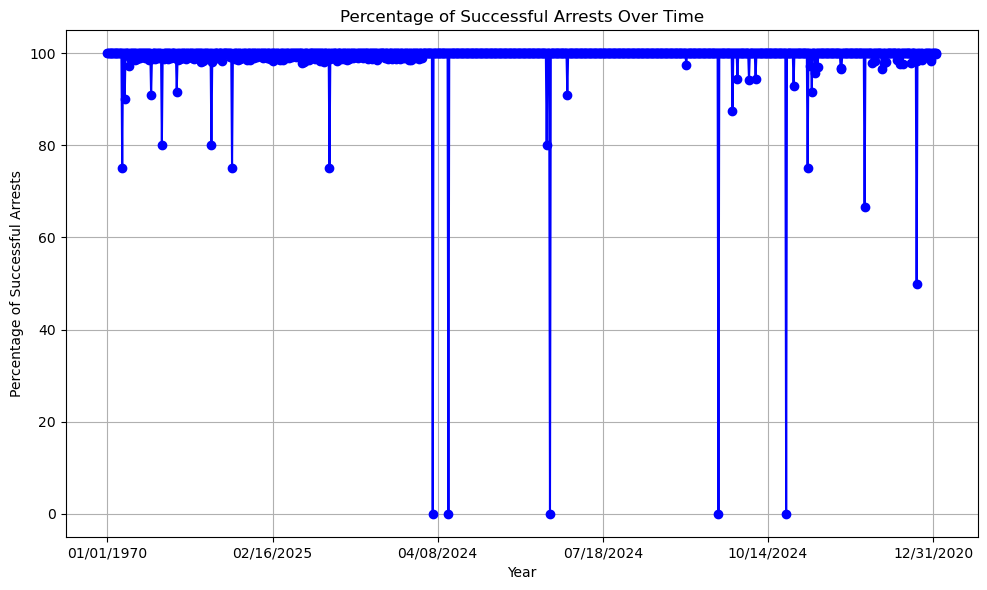

In [33]:
# Show the plot 
plt.grid(True) 
plt.tight_layout() 
plt.show()

In [34]:
import datetime

In [35]:
# Clean data, create copy, and filter based on this month (March 2018) 
cleaned_df = df[df['Latitude'].notnull() & df['Longitude'].notnull()].copy()

In [36]:
# Specify the format of the date strings 
cleaned_df['CMPLNT_FR_DT'] = pd.to_datetime(cleaned_df['CMPLNT_FR_DT'], errors='coerce', 
format='%m/%d/%Y') 

In [37]:
# Remove invalid dates (NaT) if any 
cleaned_df = cleaned_df.dropna(subset=['CMPLNT_FR_DT'])

In [38]:
# Filter based on a specific date range 
cleaned_df = cleaned_df[cleaned_df['CMPLNT_FR_DT'] > 
datetime.datetime(2018, 2, 28)]
print("Number of crimes in New York : %d" % len(cleaned_df)) 

Number of crimes in New York : 138079


In [39]:
## Create map and markers for each crime in  using folium  
crimes_map = folium.Map(location=[cleaned_df['Latitude'].mean(), 
cleaned_df['Longitude'].mean()], zoom_start=10) 
marker_cluster = MarkerCluster().add_to(crimes_map)

In [40]:
import folium 
from folium.plugins import MarkerCluster

In [41]:
# Assuming cleaned_df is your DataFrame containing the cleaned data 
crimes_map = folium.Map(location=[41.8781, -87.6298], zoom_start=10)  
# Create a map object

In [42]:
# Create a MarkerCluster object and add it to the map 
marker_cluster = MarkerCluster().add_to(crimes_map) 

In [44]:
# Loop through the first 750 rows
for index, row in cleaned_df.head(750).iterrows():
    crime_id = str(row['CMPLNT_NUM'])
    date_time = str(row['CMPLNT_FR_DT']) if not pd.isnull(row['CMPLNT_FR_DT']) else "Unknown"
    crime_type = row['OFNS_DESC']
    crime_description = row['PD_DESC']
    address = row['PREM_TYP_DESC']
    
    popup = (
        "<p> Crime ID: " + crime_id +
        "<br> Date and Time: " + date_time +
        "<br> Crime Type: " + str(crime_type) +
        "<br> Crime Description: " + str(crime_description) +
        "<br> Address: " + str(address) + "</p>"
    )

    folium.Marker([row['Latitude'], row['Longitude']], popup=popup).add_to(marker_cluster)


In [67]:
# Save the map 
crimes_map.save(r"E:\UG PROJECT\FIR\crimes_map.html")
crimes_map 


In [46]:

non_numeric_lat = cleaned_df[~cleaned_df['Latitude'].apply(lambda x: 
isinstance(x, (int, float)))]['Latitude'] 
print("Non-numeric values in 'Latitude' column:", non_numeric_lat) 
non_numeric_lon = cleaned_df[~cleaned_df['Longitude'].apply(lambda x: 
isinstance(x, (int, float)))]['Longitude'] 
print("Non-numeric values in 'Longitude' column:", non_numeric_lon)

Non-numeric values in 'Latitude' column: Series([], Name: Latitude, dtype: float64)
Non-numeric values in 'Longitude' column: Series([], Name: Longitude, dtype: float64)


In [47]:
# Drop rows with NaN values in Latitude and Longitude columns 
cleaned_df.dropna(subset=['Latitude', 'Longitude'], inplace=True)

In [48]:
# Create a Folium map centered at the mean latitude and longitude 
crimes_heatmap = folium.Map(location=[cleaned_df['Latitude'].mean(), 
cleaned_df['Longitude'].mean()], zoom_start=10)

In [66]:
# Add a HeatMap layer to the map using latitude and longitude values from 
cleaned_df 
crimes_heatmap.add_child(folium.plugins.HeatMap(cleaned_df[['Latitude', 'Longitude']].values, radius=15)) 
crimes_heatmap.save(r"E:\UG PROJECT\FIR\NYPD_Complaint_Data_Current__Year_To_Date_.csv.html")


In [62]:
crimes_heatmap 

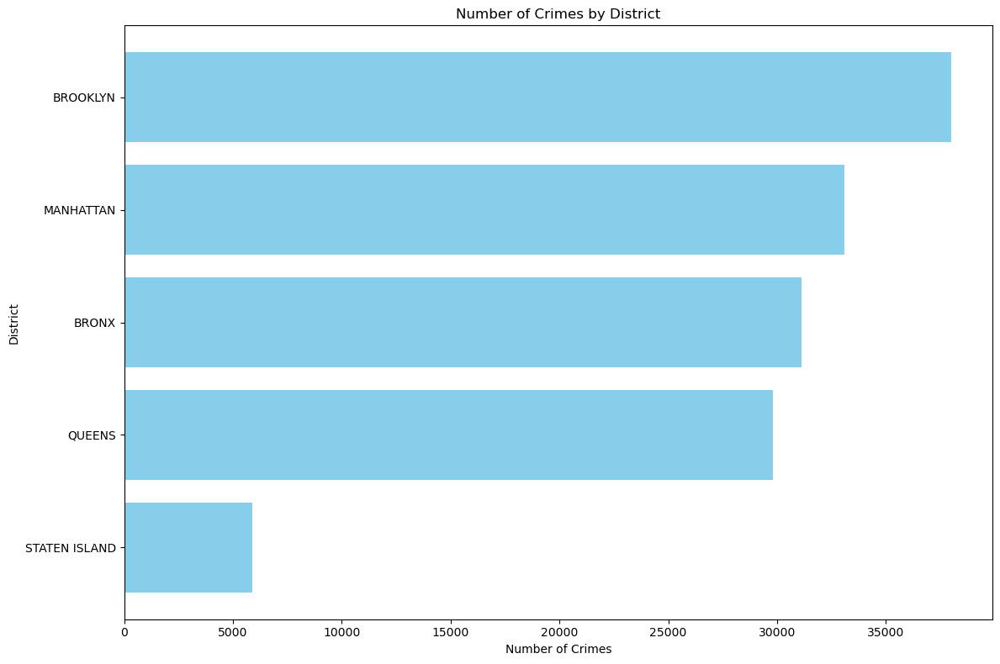

,Borough,Count
0,STATEN ISLAND,5899
1,QUEENS,29807
2,BRONX,31103
3,MANHATTAN,33090
4,BROOKLYN,37988


In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the value counts for 'BORO_NM' column
district_crime = df['BORO_NM'].value_counts(ascending=True)

# Drop '(null)' if present
district_crime = district_crime.drop('(null)', errors='ignore')

# Convert to DataFrame for easier handling
district_crime = district_crime.reset_index()
district_crime.columns = ['Borough', 'Count']

# Plot bar graph for visualization
plt.figure(figsize=(12, 8))
plt.barh(district_crime['Borough'], district_crime['Count'], color='skyblue')
plt.title("Number of Crimes by District")
plt.xlabel("Number of Crimes")
plt.ylabel("District")
plt.tight_layout()
plt.savefig('district_crime_bar.png')
plt.show()

# Check final DataFrame
district_crime
